### Построение признаков изображений глазного дна

#### Артем Севастопольский

#### Признаки для решения задачи диагностики

На глазной диабет влияет состояние оптического диска (белого пятна), сосудов (?), наличие и размер выделений стекловидного тела, микроаневризмы. Требуется сначала сегментировать эти элементы, затем строить наборы признаков.

Наборы признаков из разных статей:
* Niemeijer M et al. - набор из 21 геометрических признаков областей
* Kande et al. - набор из тех же 21 геометрич. признаков областей + 12 статистич. признаков
* Silberman et al. - набор признаков SIFT
* Staal et al. (признаки сосудов) - набор признаков, построенных для "трубки" вокруг сосуда (объединения эпсилон-окрестностей точек сосуда)
* Haloi et al. (признаки оптического диска) - HOG-дескрипторы

#### Предполагаемый план курсовой

* Методы сегментации частей глаза
    * Выделение оптического диска
    * Выделение сосудов
    * Выделение поражений глаза (exudates, microaneurysms)
* Методы построения признаковых описаний
    * Геометрические признаки областей
    * Статистические признаки (областей или всего изображения)
    * Scale-Invariant Feature Transform (SIFT)
    * Другие методы
* Анализ предложенных методов (на примере задачи диагностики ретинопатии)
    * Сравнение качества классификации при использовании геометрических, статистических и других признаков, их использовании по отдельности, в комбинациях или вместе.


In [1]:
import os
import glob
from operator import attrgetter
from functools import partial
import bisect
import warnings
warnings.simplefilter('ignore')    # suppresses meaningless skimage warnings
from collections import deque
from math import sqrt
import numpy as np
import scipy as sp
from scipy import ndimage as ndi
import pandas as pd
import sklearn
import sklearn.cluster, sklearn.preprocessing, sklearn.decomposition, sklearn.linear_model, \
    sklearn.ensemble, sklearn.grid_search, sklearn.svm
import skimage
import skimage.morphology, skimage.filters, skimage.feature, skimage.segmentation, \
    skimage.measure
import mahotas as mh
import cv2
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from joblib import Parallel, delayed
from numba import jit
from IPython.display import display
# my libraries that deal with images and this data set specifically:
import imhandle as imh
import objects_detection as od
import cluster_features as cf
import retina_im_lib as ril
import misc

In [7]:
os.path.abspath(os.curdir)

'/home/artem/Programming/Kaggle tasks/Retinopathy/scripts'

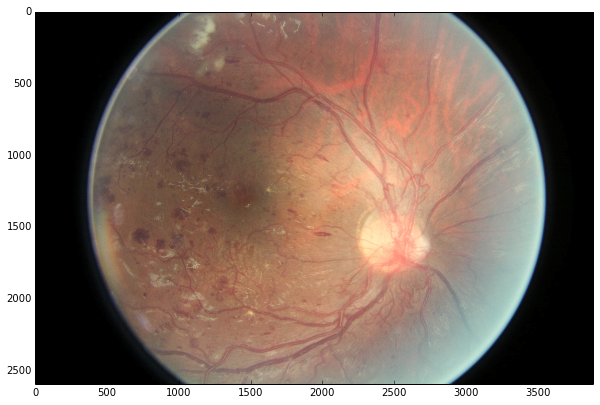

In [151]:
img = imh.load_image('../data/sample/16_left.jpeg')
imh.show_image(img)

Current shape:  (2592, 3888, 3)
New shape:  (518, 777, 3)


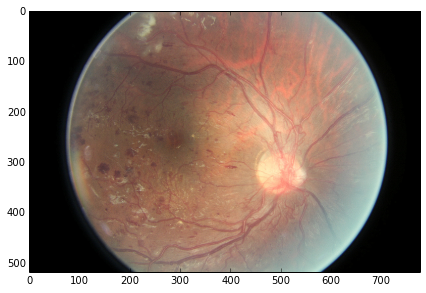

In [152]:
print 'Current shape: ', img.shape
img = sp.misc.imresize(img, (518, 777))
imh.show_image(img, fig_size=(7, 7))
print 'New shape: ', img.shape

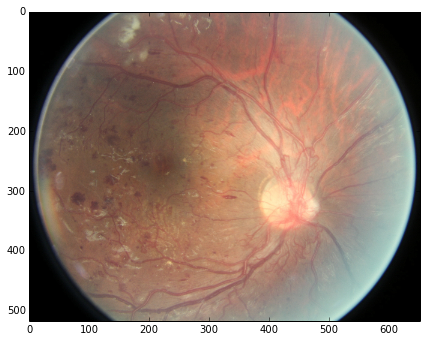

In [153]:
img = ril.crop_black_border(img)
imh.show_image(img, fig_size=(7, 7))

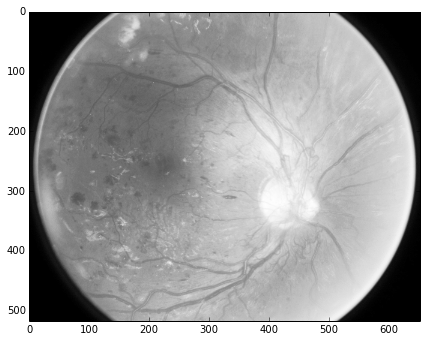

In [154]:
gb = imh.rgb_to_grayscale(img)
gb = gb.astype('uint8')
imh.show_image(gb, fig_size=(7, 7))

CPU times: user 3.22 s, sys: 76 ms, total: 3.29 s
Wall time: 7.6 s


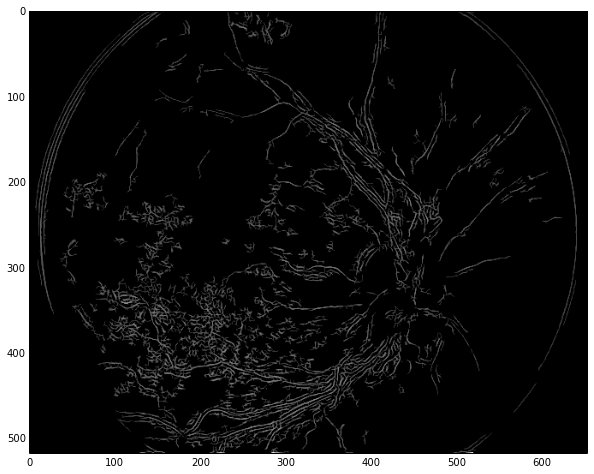

In [155]:
%time vessels = od.detect_vessels_1(gb)
imh.show_image(vessels)

CPU times: user 8min 12s, sys: 1.48 s, total: 8min 14s
Wall time: 8min 18s


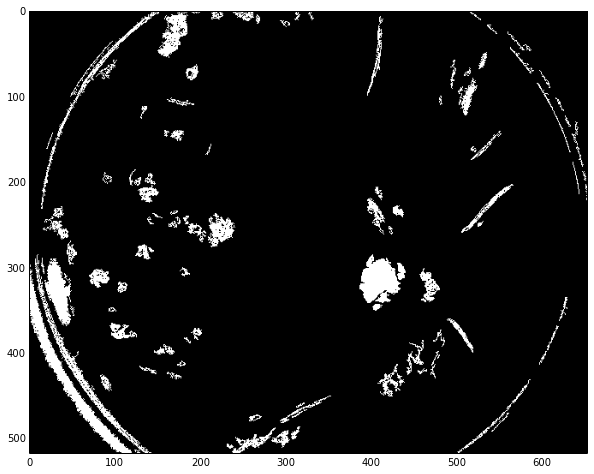

In [11]:
%time exud = od.exudate_detect_1(gb)
show_image(exud)

CPU times: user 1min 4s, sys: 264 ms, total: 1min 4s
Wall time: 1min 4s


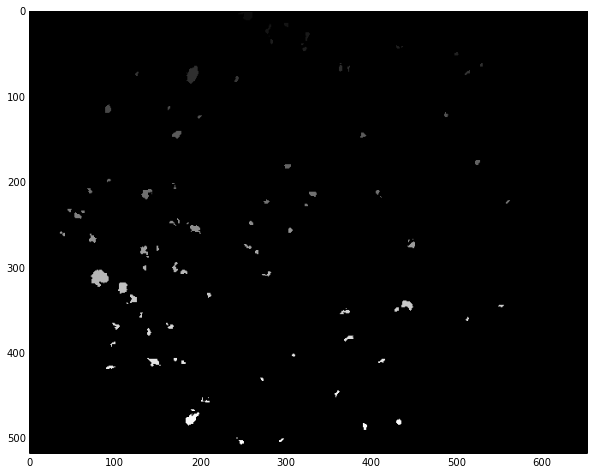

In [26]:
%time exud = od.exudate_detect_2(img)
imh.show_image(exud)

#### Схема расчетов

1. Вся интересующая выборка помещается в *../data/sub_train*
2. **save_enhanced():** для каждого изображения из *../data/sub_train* в *../data/sub_train_enhanced* добавляется изображение с тем же именем, полученное из исходного уменьшением размера и применением локальной эквализации гистограммы (CLAHE).
3. **save_exudates():** Для каждого изображения из *../data/sub_train* в *../data/sub_train_exudates* помещается изображение сегментированных пятен (поражений глаза).
4. **save_features():** В *../data/sub_train_df.csv* помещается таблица с подсчитанными признаками изображений.

In [28]:
skimage_properties = ['area',
 'bbox',
 'centroid',
 'convex_area',
 'convex_image',
 'coords',
 'eccentricity',
 'equivalent_diameter',
 'euler_number',
 'extent',
 'filled_area',
 'filled_image',
 'image',
 'inertia_tensor',
 'inertia_tensor_eigvals',
 'intensity_image',
 'label',
 'local_centroid',
 'major_axis_length',
 'max_intensity',
 'mean_intensity',
 'min_intensity',
 'minor_axis_length',
 'moments',
 'moments_central',
 'moments_hu',
 'moments_normalized',
 'orientation',
 'perimeter',
 'solidity',
 'weighted_centroid',
 'weighted_local_centroid',
 'weighted_moments',
 'weighted_moments_central',
 'weighted_moments_hu',
 'weighted_moments_normalized']

In [104]:
not_useful = ('filled_image', 'coords', 'bbox', 'convex_image', 'image', 'img', 'intensity_image', 'label', \
              'filename', 'local_centroid', 'moments_normalized', 'weighted_moments_normalized', \
              'weighted_centroid', 'weighted_local_centroid', 'euler_number')
skimage_properties = list(set(skimage_properties) - set(not_useful))
print skimage_properties
# inertia_tensor_eigvals is tuple of 2 elements for each cluster
# moments_normalized and weighted_moments_normalized have NaN values

['orientation', 'moments', 'max_intensity', 'equivalent_diameter', 'weighted_moments_hu', 'moments_hu', 'inertia_tensor', 'weighted_moments_central', 'area', 'filled_area', 'centroid', 'mean_intensity', 'major_axis_length', 'convex_area', 'perimeter', 'inertia_tensor_eigvals', 'solidity', 'extent', 'min_intensity', 'eccentricity', 'moments_central', 'minor_axis_length', 'weighted_moments']


In [2]:
# Folders with large training set
train_folder = '../data/sub_train'
train_enhanced_folder = '../data/sub_train_enhanced'
train_exudates_folder = '../data/sub_train_exudates'
train_features_csv = '../data/sub_train_df.csv'

# Folders with small (temporary) training set
#train_folder = '../data/temp_train'
#train_enhanced_folder = '../data/temp_train_enhanced'
#train_exudates_folder = '../data/temp_train_exudates'
#train_features_csv = '../data/temp_train_df.csv'

In [67]:
img = imh.load_image(train_folder + '/30089_left.jpeg')
labels = imh.load_image(train_exudates_folder + '/30089_left.jpeg')
labels = (labels * 255).astype(int)
gb = imh.rgb_to_grayscale(img)
rp = skimage.measure.regionprops(labels, gb)

In [105]:
print dir(rp[0])
for attr in dir(rp[0]):
    if attr in skimage_properties:
        print attr, '<->', getattr(rp[0], attr)

['__class__', '__delattr__', '__dict__', '__doc__', '__eq__', '__format__', '__getattribute__', '__getitem__', '__hash__', '__init__', '__iter__', '__module__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_cache_active', '_intensity_image', '_intensity_image_double', '_label_image', '_slice', 'area', 'bbox', 'centroid', 'convex_area', 'convex_image', 'coords', 'eccentricity', 'equivalent_diameter', 'euler_number', 'extent', 'filled_area', 'filled_image', 'image', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_image', 'label', 'local_centroid', 'major_axis_length', 'max_intensity', 'mean_intensity', 'min_intensity', 'minor_axis_length', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'orientation', 'perimeter', 'solidity', 'weighted_centroid', 'weighted_local_centroid', 'weighted_moments', 'weighted_moments_central', 'weighted_moments_hu', 'weighted_moments_normalized']
area <

In [198]:
def save_enhanced(folder_set, folder_enhanced):
    for img_fn in imh.image_names_in_folder(folder_set):
        img = imh.load_image(img_fn)
        img = sp.misc.imresize(img, (518, 777))
        img = ril.crop_black_border(img)
        img = skimage.exposure.equalize_adapthist(img)
        
        short_fn = os.path.split(img_fn)[-1]
        imh.save_image(os.path.join(folder_enhanced, short_fn), img)

In [201]:
%time save_enhanced(train_folder, train_enhanced_folder)
# 1 min 30 s for 26 images
# 16 min for 375 images

CPU times: user 12min 33s, sys: 3min 9s, total: 15min 42s
Wall time: 16min 12s


In [202]:
def save_exudates(folder_enhanced, folder_exudates):
    for img_fn in imh.image_names_in_folder(folder_enhanced):
        img = imh.load_image(img_fn)
        
        exudates = od.exudate_detect_2(img)
        # exudates image dtype is int since there may be as many large number of clusters as needed.
        # however, it's impossible to store images with int dtype.
        # arrays are stored in NumPy pickle (.npy) format, and (exudates != -1) mask is saved as bmp image.
        
        short_fn = os.path.split(img_fn)[-1]
        short_fn_no_ext = short_fn[:short_fn.rfind('.')]
        imh.save_image(os.path.join(folder_exudates, short_fn), exudates != -1)
        with open(os.path.join(folder_exudates, short_fn_no_ext + '.npy'), 'w') as fout:
            np.save(fout, exudates)

In [203]:
%time save_exudates(train_enhanced_folder, train_exudates_folder)
# 23 minutes for 26 images
# 5h 52min for 375 images

CPU times: user 5h 51min 37s, sys: 1min 3s, total: 5h 52min 41s
Wall time: 5h 52min 13s


In [204]:
def save_features(folder_enhanced, folder_exudates, features_fn, properties):
    fn_list = imh.image_names_in_folder(folder_enhanced)
    short_fn_list = map(lambda path: os.path.split(path)[-1], fn_list)
    prop_df = pd.DataFrame(index=short_fn_list)
    for img_fn in fn_list:
        img = imh.load_image(img_fn)
        gb = imh.rgb_to_grayscale(img)
        
        short_fn = os.path.split(img_fn)[-1]
        short_fn_no_ext = short_fn[:short_fn.rfind('.')]
        with open(os.path.join(folder_exudates, short_fn_no_ext + '.npy'), 'r') as fin:
            exudates = np.load(fin)
        region_props = skimage.measure.regionprops(exudates, gb)
        
        for prop in properties:
            if prop == 'n_clusters':
                n_clusters = cf.actual_clusters_no(exudates).size
                prop_df.loc[short_fn, 'n_clusters'] = n_clusters
                continue
            if not hasattr(region_props[0], prop):
                print 'image {}: region_props[0] does not have property {}'.format(img_fn, prop)
            else:
                prop_vals = map(attrgetter(prop), region_props)
                #print prop_vals
                if isinstance(prop_vals[0], tuple):
                    prop_vals = map(np.array, prop_vals)
                if isinstance(prop_vals[0], np.ndarray) and prop_vals[0].ndim >= 1:
                    prop_vals = map(np.ravel, prop_vals)
                    prop_vals = np.vstack(prop_vals)
                    for i in xrange(prop_vals.shape[1]):
                        prop_mean = np.mean(prop_vals[:, i])
                        prop_std = np.std(prop_vals[:, i])
                        prop_df.loc[short_fn, prop + '_{}_mean'.format(i)] = prop_mean
                        prop_df.loc[short_fn, prop + '_{}_std'.format(i)] = prop_std
                else:
                    prop_mean = np.mean(prop_vals)
                    prop_std = np.std(prop_vals)
                    prop_df.loc[short_fn, prop + '_mean'] = prop_mean
                    prop_df.loc[short_fn, prop + '_std'] = prop_std
    
    prop_df.to_csv(features_fn)
    return prop_df

In [3]:
load_from_file = True
if not load_from_file:
    %time features_df = save_features(train_enhanced_folder, train_exudates_folder, \
                                train_features_csv, \
                                ['n_clusters'] + skimage_properties)
    # 7 min for 26 images
    # 4 min for 375 images (looks like it doesn't depend)
else:
    features_df = pd.read_csv(train_features_csv, index_col=0)
display(features_df)

,n_clusters,orientation_mean,orientation_std,moments_0_mean,moments_0_std,moments_1_mean,moments_1_std,moments_2_mean,moments_2_std,moments_3_mean,...,weighted_moments_11_mean,weighted_moments_11_std,weighted_moments_12_mean,weighted_moments_12_std,weighted_moments_13_mean,weighted_moments_13_std,weighted_moments_14_mean,weighted_moments_14_std,weighted_moments_15_mean,weighted_moments_15_std
1000_left.jpeg,78,0.009985,0.906982,54.794872,65.694389,347.423077,737.317235,3537.987179,10044.165522,45507.115385,...,4960083.530600,2.905207e+07,34835.755834,179838.018403,444286.272774,2627994.660310,6699999.849550,4.248558e+07,1.112487e+08,7.395746e+08
1000_right.jpeg,84,-0.048952,1.032333,59.750000,58.883839,411.511905,661.497156,4552.678571,9654.550922,63355.726190,...,1900107.635150,5.213001e+06,27092.692741,70737.443981,184053.569191,505473.710963,1755842.653480,4.997005e+06,2.047979e+07,6.010974e+07
100_left.jpeg,37,-0.035439,0.961410,43.405405,31.916665,188.459459,229.984088,1355.000000,2382.530928,12517.810811,...,188091.844141,4.294307e+05,7430.634728,13894.845229,27899.208392,48384.033883,167060.226237,2.971615e+05,1.328862e+06,2.825776e+06
100_right.jpeg,63,-0.223220,0.871126,48.523810,59.301719,306.555556,802.659523,3774.206349,15638.101006,65855.412698,...,2978537.881110,1.930310e+07,18458.174326,55856.722982,132801.038763,479487.547140,1744447.041090,9.319061e+06,3.301858e+07,2.189630e+08
122_left.jpeg,152,0.075826,0.830186,60.013158,79.442712,406.289474,948.117939,4538.460526,15527.321335,66630.460526,...,3846439.450410,2.219564e+07,38749.065608,181624.533213,364525.573100,1870953.852920,4509196.217260,2.500846e+07,6.571073e+07,3.999835e+08
122_right.jpeg,135,0.064572,0.848383,57.562963,58.423690,352.851852,689.590458,3641.918519,11345.699679,51173.651852,...,1583397.554180,8.190829e+06,20920.063770,98213.400340,138318.432011,622090.624916,1420978.248170,6.910695e+06,1.909597e+07,1.052251e+08
129_left.jpeg,61,0.108274,1.028249,78.819672,90.658702,598.409836,980.605206,6890.934426,13926.680813,99037.360656,...,4541109.324040,1.822009e+07,88652.013665,530757.160845,723308.186321,4269957.920060,7276582.741140,4.082871e+07,8.460913e+07,4.389144e+08
129_right.jpeg,61,-0.145593,0.804991,57.311475,74.630355,414.245902,1036.951011,5038.573770,17282.267278,78246.737705,...,4574747.039250,2.426572e+07,25657.428804,113611.192662,326114.783296,1731870.214790,5195321.743280,2.923518e+07,9.058474e+07,5.200205e+08
13_left.jpeg,98,-0.017753,0.874310,38.520408,44.142910,187.102041,404.641501,1545.693878,4688.776294,16550.020408,...,699406.773867,3.656083e+06,10215.807142,39069.320313,80695.926311,351866.761621,829796.522592,3.970778e+06,9.819640e+06,5.205583e+07
13_right.jpeg,101,-0.060735,0.889950,47.891089,46.771384,258.287129,492.202975,2182.900990,6667.579726,23986.683168,...,982490.693646,6.348708e+06,14554.946908,58281.369614,104889.726665,522840.916275,1042536.246010,6.229057e+06,1.269424e+07,8.774557e+07


In [98]:
train_labels = pd.read_csv('../data/trainLabels.csv', index_col='image')
display(train_labels)

,level
image,
10_left,0
10_right,0
13_left,0
13_right,0
15_left,1
15_right,2
16_left,4
16_right,4
17_left,0


[0 0 0 0 0 0 2 2 0 0 0 2 0 0 1 2 0 0 4 4 0 1 0 0 0 0 0 0 2 2 0 0 0 0 0 0 4
 3 0 0 0 0 1 1 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 0 1 1 0 0 4 4 0 0 2 4 1 0 0 0
 0 0 0 0 0 0 2 2 0 0 3 3 0 0 2 1 0 0 2 2 0 0 0 0 0 0 0 0 0 0 2 1 0 0 0 0 4
 4 0 0 3 2 0 0 0 0 0 0 0 0 2 2 0 0 2 2 0 2 0 0 0 0 2 2 1 2 0 0 0 0 0 0 0 0
 3 2 0 0 0 0 1 1 2 2 1 2 2 2 0 0 0 0 3 2 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 2 2 2 2 0 0 0 0 2 2 0 0 0 0 0 0 2 2 0 0 2 2 2 2 0 0 0 0 0 0 1 0 0 0
 2 2 0 0 0 0 0 0 0 0 0 0 0 0 2 2 1 1 0 0 0 0 4 4 2 2 0 0 0 0 4 4 2 2 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 2 2 2 2 2 2
 0 0 0 0 0 0 0 0 0 0 2 2 1 0 1 0 4 4 0 0 0 0 0 2 0 0 2 0 0 0 0 0 0 0 0 0 0
 0 4 2 1 2]


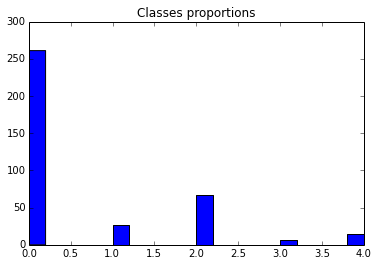

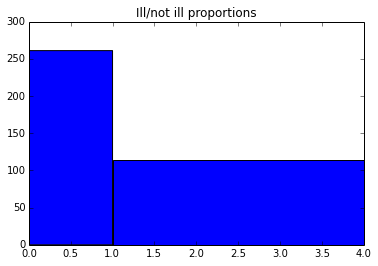

In [99]:
def get_answer(short_fn):
    short_fn_no_ext = short_fn[:short_fn.rfind('.')]
    return train_labels.loc[short_fn_no_ext, 'level']

y_train = map(get_answer, features_df.index)
y_train = np.array(y_train)
print y_train
plt.title('Classes proportions')
plt.hist(y_train, bins=20)
plt.show()
plt.title('Ill/not ill proportions')
plt.hist(y_train, bins=[0, 1, 4])
plt.show()

Далее производится не классификация стадии болезни, а факт болезни (стадия <= 1 &mdash; не болен, >= 2 &mdash; болен).

In [100]:
yb_train = y_train.copy()
yb_train[yb_train <= 1] = 0
yb_train[yb_train >= 2] = 1

Изображения из выборки с самой тяжелой стадией болезни

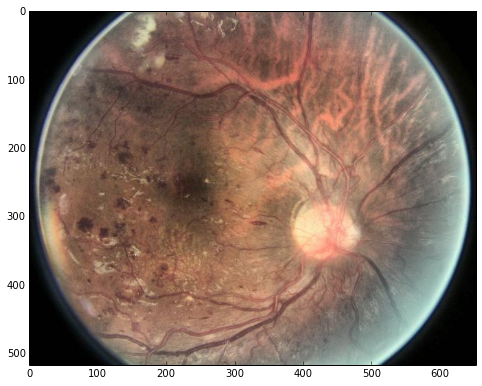

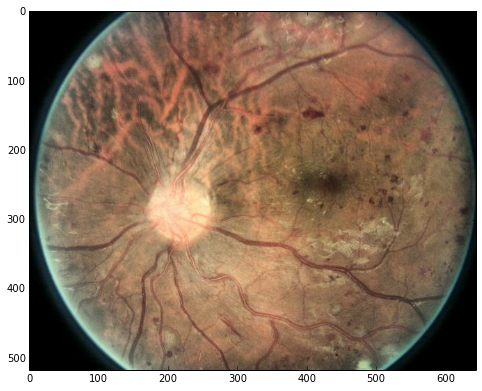

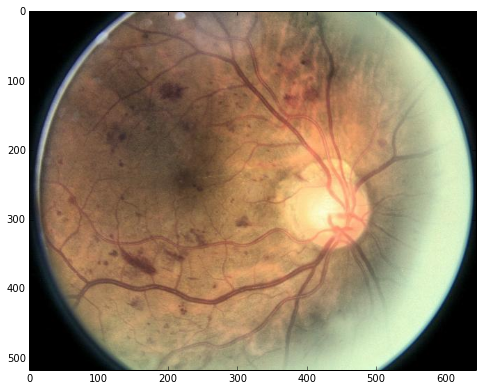

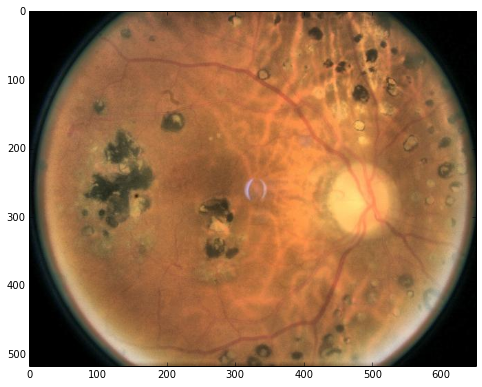

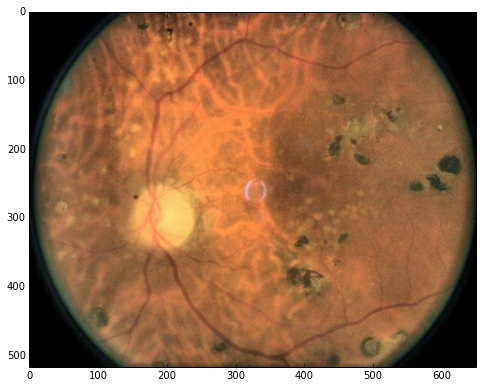

...

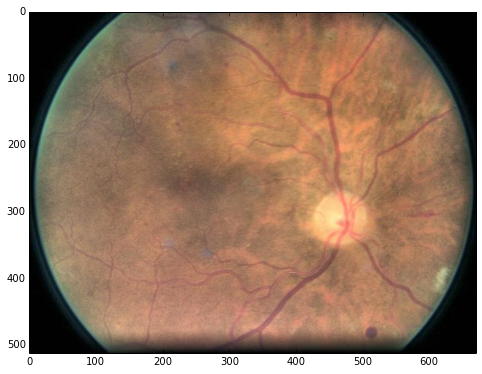

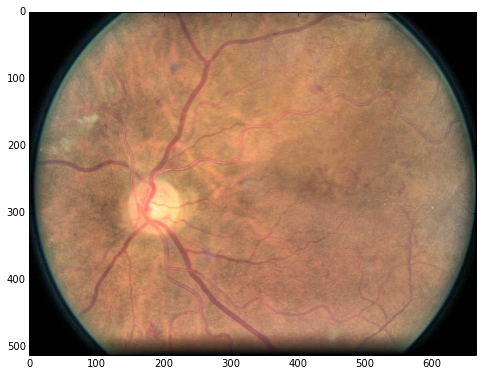

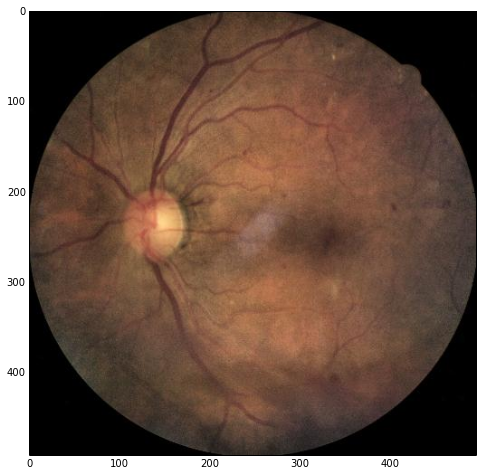

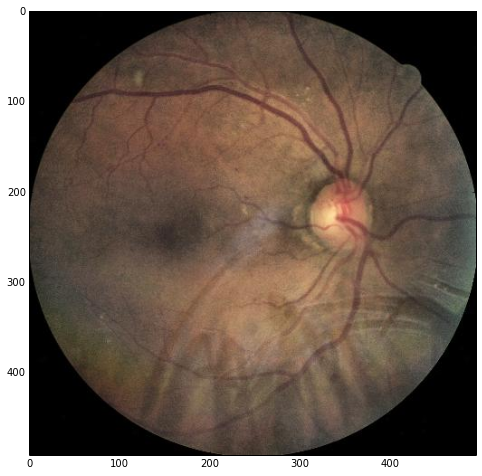

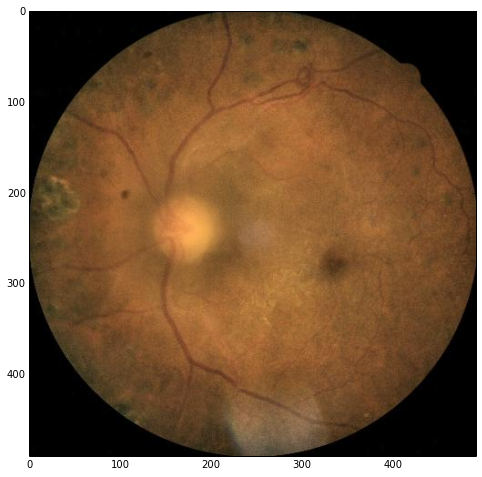

In [108]:
ill_fn = features_df.index[y_train == 4]
for fn in ill_fn:
    full_fn = os.path.join(train_enhanced_folder, fn)
    img = imh.load_image(full_fn)
    imh.show_image(img, fig_size=(8, 8))

**compute_image_features** &mdash; вспомогательная функция, осуществляющая процесс получения признаков по картинке. Возвращает признаки в list.

In [43]:
# Entire feature extraction process (returns list of desired properties without csv generation)
def compute_image_features(folder, properties):
    '''Returns list of image filenames and features for images in folder `folder`.
    Properties `properties` are acquired using skimage.measure.regionprops function.'''
    prop_list = []
    for img_fn in sorted(glob.glob(os.path.join(folder, '*.jpeg'))):
        img = imh.load_image(img_fn)
        img = sp.misc.imresize(img, (518, 777))
        img = ril.crop_black_border(img)
        img = skimage.exposure.equalize_adapthist(img)
        gb = imh.rgb_to_grayscale(img)
        gb = (gb * 255).astype(np.uint8)
        imh.show_image(img, fig_size=(5, 5))
        imh.show_image(gb, fig_size=(5, 5))
        plt.show()
        
        exudates = od.exudate_detect_2(img)
        region_props = skimage.measure.regionprops(exudates, gb)
        cur_props = {'img': img, 'filename': img_fn}
        for prop in properties:
            if not hasattr(region_props[0], prop):
                print 'image {}: region_props[0] does not have property {}'.format(img_fn, prop)
            else:
                cur_props[prop] = map(attrgetter(prop), region_props)
        prop_list.append(cur_props)
    return prop_list

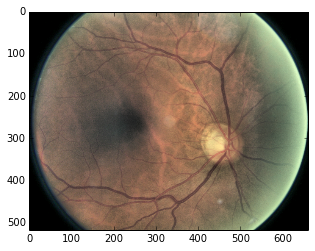

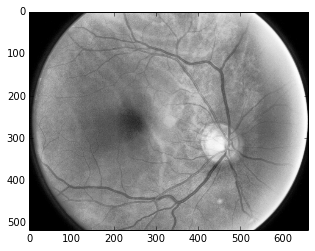

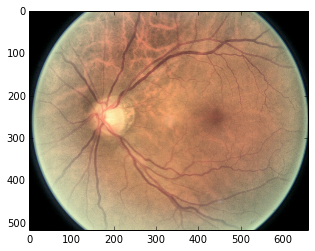

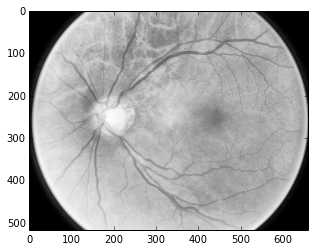

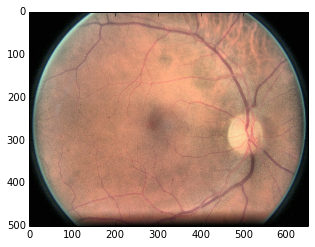

...

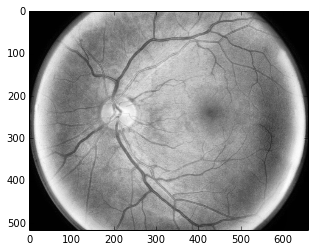

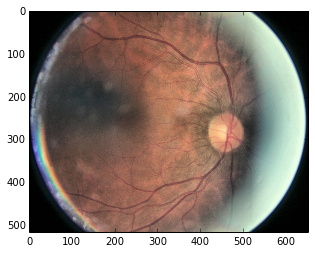

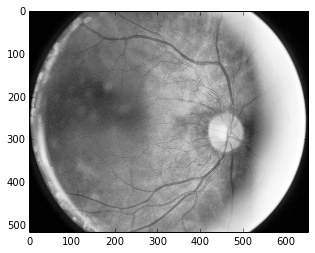

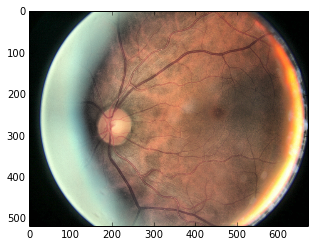

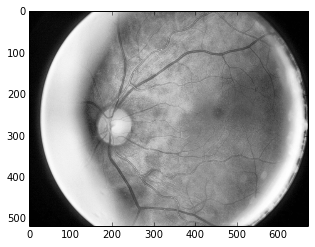

In [44]:
features = compute_image_features('../data/disk_fit/', skimage_properties)

### Классификация (с имеющимися признаками)

In [6]:
def qw_kappa_score(y_true, y_pred, min_rating=0, max_rating=4):
    O = sklearn.metrics.confusion_matrix(y_true, y_pred, labels=np.arange(min_rating, max_rating + 1))
    O = O.astype(np.float64)
    w = np.zeros_like(O, dtype=np.float64)
    N = w.shape[0]
    for i in xrange(w.shape[0]):
        for j in xrange(i + 1, w.shape[1]):
            w[i, j] = w[j, i] = (i - j) ** 2 / float(N - 1)
    # ------
    # piece of code below is taken from SkLL project, 
    # http://skll.readthedocs.org/en/latest/_modules/skll/metrics.html#kappa 
    #min_rating = min(np.min(y_true), np.min(y_pred))
    #max_rating = max(np.max(y_true), np.max(y_pred))
    num_ratings = max_rating - min_rating + 1
    num_scored_items = float(y_true.size)
    
    hist_true = np.bincount(y_true, minlength=num_ratings)
    hist_true = hist_true[:num_ratings] / num_scored_items
    hist_pred = np.bincount(y_pred, minlength=num_ratings)
    hist_pred = hist_pred[:num_ratings] / num_scored_items
    E = np.outer(hist_true, hist_pred)
    E /= float(E.sum())
    O /= float(O.sum())
    # ------
    #print 'E:', E
    #print 'O:', O
    
    kappa = 1 - (w * O).sum() / float((w * E).sum())
    return kappa

def qw_kappa_estimate(estimator, X, y):
    y_pred = estimator.predict(X)
    #print 'y_pred:', y_pred
    #print 'y_true:', y
    kappa = qw_kappa_score(y, y_pred)
    return kappa

In [112]:
scaler = sklearn.preprocessing.StandardScaler()
features_df_scaled = scaler.fit_transform(features_df)
features_df_scaled = pd.DataFrame(data=features_df_scaled, 
                                  index=features_df.index, 
                                  columns=features_df.columns)
display(features_df_scaled)

,n_clusters,orientation_mean,orientation_std,moments_0_mean,moments_0_std,moments_1_mean,moments_1_std,moments_2_mean,moments_2_std,moments_3_mean,...,weighted_moments_11_mean,weighted_moments_11_std,weighted_moments_12_mean,weighted_moments_12_std,weighted_moments_13_mean,weighted_moments_13_std,weighted_moments_14_mean,weighted_moments_14_std,weighted_moments_15_mean,weighted_moments_15_std
1000_left.jpeg,0.457969,0.064213,-0.008373,0.161915,-0.033636,-0.081890,-0.224151,-0.249054,-0.347278,-0.320170,...,-0.168273,-0.159678,0.058510,0.142522,0.054865,0.133200,-0.048847,0.003581,-0.133814,-0.103567
1000_right.jpeg,0.657394,-0.338868,1.644227,0.500902,-0.243104,0.237568,-0.330384,-0.014736,-0.367152,-0.171798,...,-0.330756,-0.379296,-0.139748,-0.371204,-0.342097,-0.449336,-0.373998,-0.425930,-0.346794,-0.372743
100_left.jpeg,-0.904770,-0.246446,0.709190,-0.617253,-1.072514,-0.874263,-0.934981,-0.753162,-0.738085,-0.594405,...,-0.421664,-0.423364,-0.643186,-0.638861,-0.580296,-0.574787,-0.478484,-0.479777,-0.391730,-0.395437
100_right.jpeg,-0.040594,-1.530721,-0.481087,-0.267096,-0.230251,-0.285599,-0.132600,-0.194505,-0.061941,-0.151018,...,-0.273492,-0.249491,-0.360831,-0.441273,-0.420278,-0.456468,-0.374748,-0.376412,-0.317373,-0.309812
122_left.jpeg,2.917545,0.514511,-1.020830,0.518905,0.389211,0.211536,0.071204,-0.018019,-0.067591,-0.144575,...,-0.227407,-0.222843,0.158708,0.150934,-0.066803,-0.074573,-0.192925,-0.196657,-0.240664,-0.238099
122_right.jpeg,2.352507,0.437548,-0.780923,0.351284,-0.257256,-0.054830,-0.291022,-0.225054,-0.280889,-0.273065,...,-0.347573,-0.351862,-0.297795,-0.241827,-0.411862,-0.417330,-0.396020,-0.404005,-0.350041,-0.354870
129_left.jpeg,-0.107069,0.736431,1.590382,1.805484,0.734174,1.169182,0.116722,0.525228,-0.149237,0.124818,...,-0.190520,-0.259468,1.436450,1.794908,0.480488,0.583845,-0.010928,-0.015402,-0.196321,-0.222676
129_right.jpeg,-0.107069,-0.999814,-1.352996,0.334079,0.241201,0.251196,0.195669,0.097470,0.021926,-0.048011,...,-0.188734,-0.203772,-0.176497,-0.169323,-0.125395,-0.112746,-0.147802,-0.148231,-0.182300,-0.190545
13_left.jpeg,1.122719,-0.125492,-0.439110,-0.951442,-0.696480,-0.881029,-0.690267,-0.709126,-0.620447,-0.560886,...,-0.394513,-0.393639,-0.571873,-0.520321,-0.499760,-0.491494,-0.434899,-0.437688,-0.371807,-0.375934
13_right.jpeg,1.222432,-0.419450,-0.232915,-0.310382,-0.615638,-0.526199,-0.567583,-0.561978,-0.519512,-0.499066,...,-0.379481,-0.368833,-0.460771,-0.429856,-0.462854,-0.444570,-0.420909,-0.411814,-0.365062,-0.361795


In [116]:
reload(misc)
#clf_svm = sklearn.svm.SVC()
#gs = sklearn.grid_search.GridSearchCV(clf_svm, {'C': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
#                                                          'kernel': ['linear']}, 
#                                      cv=10, verbose=5)#, scoring=qw_kappa_estimate)
#gs.fit(features_df, yb_train)

gs_result = misc.grid_fit_search_CV(sklearn.svm.LinearSVC, 
                                    {'C': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]},
                                    features_df_scaled, yb_train, n_folds=10)
display(gs_result)

,CV score
C,
0.001,0.727726
0.010,0.738545
0.100,0.70682
1.000,0.677438
10.000,0.642568
100.000,0.632338
1000.000,0.582338


In [114]:
reload(misc)
#clf_svm = sklearn.svm.SVC()
#gs = sklearn.grid_search.GridSearchCV(clf_svm, {'C': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
#                                                'kernel': ['rbf'],
#                                                'gamma': [0.01, 0.1, 1.0, 3.0, 5.0, 10.0]},
#                                      cv=10, verbose=5)
#gs.fit(features_df, yb_train)

yb_train_pm = yb_train.copy()
yb_train_pm[yb_train == 0] = -1
gs_result = misc.grid_fit_search_CV(sklearn.svm.OneClassSVM, {'nu': [0.01, 0.2, 0.4, 0.5, 0.6, 0.8, 0.95],
                                                              'kernel': ['rbf'],
                                                              'gamma': [0.01, 0.1, 1.0, 3.0, 10.0, 100.0]},
                                    features_df_scaled, yb_train_pm, n_folds=10)
display(gs_result) 

CV score
nu   gamma           
0.01 0.01    0.352675
     0.10    0.733282
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442
0.20 0.01    0.363423
     0.10    0.733282
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442
0.40 0.01    0.443306
     0.10    0.733282
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442
0.50 0.01     0.50507
     0.10    0.733282
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442
0.60 0.01    0.542421
     0.10    0.733282
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442
0.80 0.01    0.638103
     0.10    0.733282
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442
0.95 0.01    0.744026
     0.10    0.760179
     1.00    0.765442
     3.00    0.765442
     10.00   0.765442
     100.00  0.765442

In [117]:
#gs = sklearn.grid_search.GridSearchCV(clf_rf, {'n_estimators': [10, 100, 1000]},
#                                      cv=10, verbose=5)
#gs.fit(features_df, yb_train)


gs_result = misc.grid_fit_search_CV(sklearn.ensemble.RandomForestClassifier, 
                                    {'n_estimators': [100, 500, 1500]},
                                    features_df_scaled, yb_train, n_folds=10)
display(gs_result)

,CV score
n_estimators,
100,0.765442
500,0.757255
1500,0.760032


In [118]:
gs_result = misc.grid_fit_search_CV(sklearn.linear_model.RidgeClassifier, 
                                    {'alpha': [0.001, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0]},
                                    features_df_scaled, yb_train, n_folds=10)
display(gs_result)

,CV score
alpha,
0.001,0.629702
0.100,0.685475
1.000,0.693662
5.000,0.712083
10.000,0.722756
50.000,0.743808
100.000,0.75192
500.000,0.759886


In [119]:
gs_result = misc.grid_fit_search_CV(sklearn.linear_model.LogisticRegression, 
                                    {'C': [0.001, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0]},
                                    features_df_scaled, yb_train, n_folds=10)
display(gs_result)

,CV score
C,
0.001,0.640161
0.100,0.733065
1.000,0.706674
5.000,0.685404
10.000,0.68007
50.000,0.672175
100.000,0.658946
500.000,0.645721


In [148]:
from sklearn.dummy import DummyClassifier
clf_dummy = DummyClassifier(strategy='most_frequent', random_state=0)
sklearn.cross_validation.cross_val_score(clf_dummy, features_df_scaled, yb_train).mean()

0.76534459805427557

#### Анализ ошибок

In [165]:
clf_lr = sklearn.linear_model.LogisticRegression(C=1.0)
Xp_train, Xp_test, yp_train, yp_test = sklearn.cross_validation.train_test_split(features_df_scaled, yb_train,
                                                                                 random_state=0)
clf_lr.fit(Xp_train, yp_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [166]:
yp_pred = clf_lr.predict(Xp_test)
print 'predictions\t:', yp_pred
print 'true\t\t:', yp_test
print 'accuracy\t:', (yp_pred == yp_test).mean()
print 'confusion matrix:'
print sklearn.metrics.confusion_matrix(yp_test, yp_pred)

predictions	: [0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0]
true		: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 0 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0]
accuracy	: 0.659574468085
confusion matrix:
[[58 11]
 [21  4]]


predictions	: [  1.76991562e-01   1.22605680e-01   8.49633254e-03   6.91865549e-01
   4.19135696e-01   5.63928973e-01   1.19522372e-01   2.93617172e-02
   3.72656957e-01   6.20663807e-02   1.57600220e-01   8.55065038e-02
   1.73410708e-01   1.34906690e-01   1.06112994e-01   6.30750897e-01
   2.42923363e-01   2.55180991e-01   9.04587882e-01   6.90132182e-03
   5.00715782e-01   1.94257533e-01   1.59118749e-01   7.47666477e-02
   5.24402667e-03   3.40665184e-01   4.87528226e-02   1.21539719e-01
   4.55939304e-01   1.61757108e-01   8.17018609e-02   1.97901731e-01
   1.75720484e-01   7.50061923e-01   8.03396014e-02   1.25473832e-01
   4.89486925e-01   5.61158320e-02   1.29314657e-01   1.12650953e-01
   4.02564119e-01   2.31902880e-03   3.34196012e-02   1.38361760e-02
   9.19442263e-02   2.52842140e-01   8.42369426e-01   4.57177990e-01
   1.61704388e-02   9.99919844e-01   8.99456370e-02   4.43521960e-01
   4.96225571e-01   1.55163433e-01   5.65255849e-01   9.11364319e-01
   2.64624163e-01   

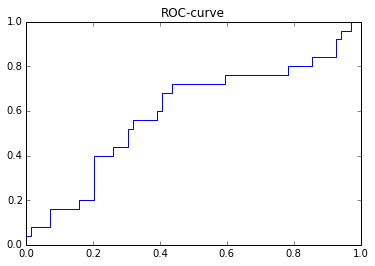

Accuracy for thresholds:
[ 0.25531915  0.26595745  0.25531915  0.29787234  0.27659574  0.34042553
  0.32978723  0.36170213  0.30851064  0.35106383  0.34042553  0.37234043
  0.35106383  0.36170213  0.35106383  0.40425532  0.39361702  0.40425532
  0.38297872  0.40425532  0.39361702  0.5106383   0.5         0.63829787
  0.62765957  0.68085106  0.67021277  0.72340426  0.70212766  0.71276596
  0.70212766  0.72340426  0.71276596  0.73404255]


In [167]:
yp_pred_proba = clf_lr.predict_proba(Xp_test)[:, 1]
print 'predictions\t:', yp_pred_proba
print 'AUC:\t\t:', sklearn.metrics.roc_auc_score(yp_test, yp_pred_proba)
plt.title('ROC-curve')
fpr, tpr, thr = sklearn.metrics.roc_curve(yp_test, yp_pred_proba)
plt.plot(fpr, tpr)
plt.show()

acc = np.empty_like(thr)
for i in xrange(len(thr)):
    yp_pred = yp_pred_proba < thr[i]
    acc[i] = (yp_pred == yp_test).mean()
print 'Accuracy for thresholds:'
print acc

### Отбор признаков

#### Проверка качества для выборки с отобранными признаками c помощью **априорной оценки признаков**.

Априорная оценка признаков. От каждого признака берется значение сигмоиды, затем исследуется качество (AUC) признака как ответа классификатора.

In [152]:
auc_prior = np.empty((features_df_scaled.shape[1],))
for i in xrange(features_df_scaled.shape[1]):
    f = features_df_scaled.iloc[:, i]
    f = 1.0 / (1.0 + np.exp(-f))
    auc_prior[i] = sklearn.metrics.roc_auc_score(yb_train, f)
print 'Prior AUC for each feature:'
print auc_prior
print '\nFeatures with prior AUC >= 0.55:'
print(features_df_scaled.columns[auc_prior >= 0.55])

Prior AUC for each feature:
[ 0.46753247  0.51662971  0.4731153   0.48962623  0.50277162  0.49663446
  0.49996041  0.49679284  0.49386284  0.49406082  0.4891115   0.49707
  0.49877257  0.50098986  0.49176433  0.49429838  0.48614191  0.48958663
  0.48131137  0.49572379  0.49267501  0.4971096   0.48725055  0.49259582
  0.4832911   0.48725055  0.47877732  0.49223947  0.48875515  0.49287298
  0.48633988  0.48824042  0.48135097  0.48511245  0.47861894  0.45430789
  0.52209376  0.49022015  0.49623852  0.51278904  0.48170732  0.48903231
  0.47062084  0.49000238  0.48505306  0.48212306  0.47669861  0.48590434
  0.47442192  0.50534526  0.47826259  0.51241289  0.47584732  0.46460247
  0.44646817  0.45723788  0.44627019  0.45830694  0.43847007  0.46476085
  0.45937599  0.48166772  0.4541891   0.48867596  0.46183085  0.4891115
  0.43858885  0.48123218  0.47846056  0.55365062  0.45795059  0.55365062
  0.45795059  0.47446151  0.48020272  0.49742635  0.49596136  0.54549414
  0.49790149  0.49299176  0

In [155]:
best_feat_idx = features_df.columns[auc_prior >= 0.55]
features_kbest = features_df_scaled.loc[:, best_feat_idx]

In [163]:
clf_lr = sklearn.linear_model.LogisticRegression(C=1.0)
Xp_train, Xp_test, yp_train, yp_test = sklearn.cross_validation.train_test_split(features_kbest, yb_train,
                                                                                 random_state=0)
clf_lr.fit(Xp_train, yp_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [164]:
yp_pred = clf_lr.predict(Xp_test)
print 'predictions\t:', yp_pred
print 'true\t\t:', yp_test
print 'accuracy\t:', (yp_pred == yp_test).mean()
print 'confusion matrix:'
print sklearn.metrics.confusion_matrix(yp_test, yp_pred)

predictions	: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
true		: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 0 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0]
accuracy	: 0.765957446809
confusion matrix:
[[69  0]
 [22  3]]


predictions	: [ 0.25444386  0.2618757   0.25230114  0.21641629  0.23882738  0.27843163
  0.2738478   0.32322934  0.27641876  0.22158492  0.22833567  0.32644303
  0.19005905  0.33836074  0.21953344  0.25152119  0.24850877  0.75836021
  0.301169    0.39310505  0.20624502  0.22464996  0.32131536  0.00387113
  0.45672389  0.2282539   0.23964891  0.1509712   0.24124123  0.29574328
  0.25054486  0.13889887  0.3102039   0.25668124  0.24936133  0.1773894
  0.18139681  0.17192183  0.22719938  0.22169689  0.21832618  0.21851878
  0.24824846  0.19286538  0.31171834  0.20804038  0.36624506  0.30573919
  0.30365609  0.24883927  0.37160449  0.23090602  0.25779173  0.16925897
  0.17097661  0.34014508  0.23014362  0.20777459  0.27737046  0.21082783
  0.20355537  0.23915056  0.6437357   0.15697012  0.19491811  0.29128021
  0.92490822  0.38452388  0.3160997   0.4522502   0.23789674  0.18779889
  0.20509415  0.30512231  0.28933093  0.27178031  0.17401726  0.05052123
  0.24452064  0.28027111  0.26919136  

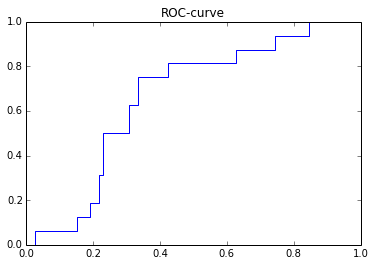

Accuracy for thresholds:
[ 0.17021277  0.18085106  0.19148936  0.18085106  0.28723404  0.27659574
  0.30851064  0.29787234  0.31914894  0.29787234  0.30851064  0.27659574
  0.34042553  0.31914894  0.34042553  0.31914894  0.39361702  0.38297872
  0.55319149  0.54255319  0.63829787  0.62765957  0.71276596  0.70212766
  0.82978723]


In [158]:
yp_pred_proba = clf_lr.predict_proba(Xp_test)[:, 1]
print 'predictions\t:', yp_pred_proba
print 'AUC:\t\t:', sklearn.metrics.roc_auc_score(yp_test, yp_pred_proba)
plt.title('ROC-curve')
fpr, tpr, thr = sklearn.metrics.roc_curve(yp_test, yp_pred_proba)
plt.plot(fpr, tpr)
plt.show()

acc = np.empty_like(thr)
for i in xrange(len(thr)):
    yp_pred = yp_pred_proba < thr[i]
    acc[i] = (yp_pred == yp_test).mean()
print 'Accuracy for thresholds:'
print acc

#### Проверка качества для выборки с отобранными признаками c помощью sklearn.feature_selection.SelectKBest()

Отбор признаков с помощью алгоритма scikit-learn: **sklearn.feature_selection.SelectKBest()**.

In [170]:
import sklearn.feature_selection
kbest = sklearn.feature_selection.SelectKBest()
features_kbest = kbest.fit_transform(features_df_scaled, yb_train)

# acquiring names of K best features
for i in xrange(features_kbest.shape[1]):
    for j in xrange(features_df_scaled.shape[1]):
        if np.all(np.isclose(features_df_scaled.iloc[:, j] - features_kbest[:, i], 0)):
            print i, ': ', features_df_scaled.columns[j]
            break

0 :  moments_hu_0_std
1 :  moments_hu_1_std
2 :  weighted_moments_central_7_mean
3 :  weighted_moments_central_11_mean
4 :  weighted_moments_central_15_mean
5 :  centroid_0_mean
6 :  eccentricity_mean
7 :  eccentricity_std
8 :  moments_central_7_mean
9 :  moments_central_11_mean


In [171]:
clf_lr = sklearn.linear_model.LogisticRegression(C=1.0)
Xp_train, Xp_test, yp_train, yp_test = sklearn.cross_validation.train_test_split(features_kbest, yb_train,
                                                                                 random_state=0)
clf_lr.fit(Xp_train, yp_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [172]:
yp_pred = clf_lr.predict(Xp_test)
print 'predictions\t:', yp_pred
print 'true\t\t:', yp_test
print 'accuracy\t:', (yp_pred == yp_test).mean()
print 'confusion matrix:'
print sklearn.metrics.confusion_matrix(yp_test, yp_pred)

predictions	: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
true		: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 0 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0]
accuracy	: 0.765957446809
confusion matrix:
[[69  0]
 [22  3]]


predictions	: [ 0.2566211   0.14440258  0.16055856  0.29131748  0.16952972  0.25092175
  0.23568825  0.20206254  0.30226396  0.28563749  0.2634959   0.22423585
  0.15759653  0.14120521  0.26495812  0.17776119  0.29754383  0.27854398
  0.28993784  0.04436491  0.29068194  0.31187667  0.29084123  0.20892496
  0.25085716  0.2799333   0.19314793  0.2633703   0.25257103  0.3315401
  0.208198    0.18173735  0.34228556  0.41964672  0.38093317  0.2442166
  0.21111114  0.18112407  0.23561887  0.168558    0.24157488  0.12624384
  0.12503602  0.13221881  0.30562757  0.3707095   0.36120043  0.31438873
  0.07873049  0.99248543  0.16059812  0.20833033  0.28830956  0.24125611
  0.21934488  0.32346099  0.2550572   0.29991734  0.23524291  0.34426942
  0.19685089  0.17029119  0.07064946  0.15862237  0.29194602  0.17796029
  0.18843632  0.17548131  0.21659352  0.1932723   0.25552663  0.2417942
  0.26417517  0.26653584  0.34083473  0.67574082  0.19067527  0.11201612
  0.2489229   0.25854932  0.19617464  0.

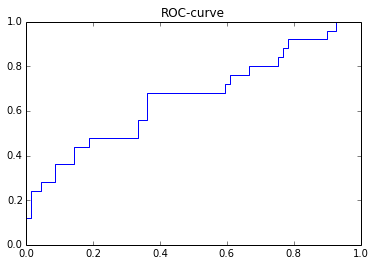

Accuracy for thresholds:
[ 0.25531915  0.23404255  0.24468085  0.21276596  0.23404255  0.22340426
  0.25531915  0.23404255  0.27659574  0.25531915  0.28723404  0.27659574
  0.38297872  0.36170213  0.38297872  0.35106383  0.5212766   0.5106383
  0.5212766   0.5106383   0.55319149  0.54255319  0.60638298  0.59574468
  0.60638298  0.59574468  0.60638298  0.59574468  0.68085106  0.67021277
  0.69148936  0.68085106  0.73404255]


In [173]:
yp_pred_proba = clf_lr.predict_proba(Xp_test)[:, 1]
print 'predictions\t:', yp_pred_proba
print 'AUC:\t\t:', sklearn.metrics.roc_auc_score(yp_test, yp_pred_proba)
plt.title('ROC-curve')
fpr, tpr, thr = sklearn.metrics.roc_curve(yp_test, yp_pred_proba)
plt.plot(fpr, tpr)
plt.show()

acc = np.empty_like(thr)
for i in xrange(len(thr)):
    yp_pred = yp_pred_proba < thr[i]
    acc[i] = (yp_pred == yp_test).mean()
print 'Accuracy for thresholds:'
print acc